In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from itertools import combinations
import matplotlib.pyplot as plt


from matplotlib.pyplot import cm
from mpl_toolkits.mplot3d import Axes3D

In [4]:
df = pd.read_csv('df_ex-SI_dummies.csv')
df['subway_dummy'] = np.where(df['num_subway_entrances']!=0, 1, 0)

In [5]:
df_sorted = df.sort_values(by=['recycling_bin_count'])

In [6]:
df_sorted

,Unnamed: 0,zipcode,median_income,population,county,median_rent,restaurant_count,recycling_bin_count,num_subway_entrances,subway_bracket,logincome,logrent,logrestaurant,predicted_inc,difference,Bronx County,Kings County,New York County,Queens County,subway_dummy
86,86,11693,54873.7130,11120,Queens County,1600.0,36.0,0.0,1.0,"(0, 6]",10.912790,7.377759,3.583519,10.756396,0.156394,0,0,0,1,1
29,29,10033,36462.7783,59049,New York County,1950.0,120.0,0.0,0.0,0,10.504047,7.575585,4.787492,10.768683,-0.264636,0,0,1,0,0
38,38,10075,112267.5519,25187,New York County,2750.0,93.0,0.0,0.0,0,11.628640,7.919356,4.532599,11.183193,0.445447,0,0,1,0,0
39,39,10128,105186.9788,59434,New York County,2997.5,148.0,0.0,0.0,0,11.563495,8.005534,4.997212,11.143683,0.419812,0,0,1,0,0
24,24,10028,105456.4514,40914,New York County,2895.0,198.0,0.0,16.0,"(6, 72]",11.566053,7.970740,5.288267,11.175385,0.390669,0,0,1,0,1
48,48,11101,39955.0990,22556,Queens County,2835.0,285.0,0.0,21.0,"(6, 72]",10.595512,7.949797,5.652489,11.218665,-0.623153,0,0,0,1,1
49,49,11104,50944.0617,29376,Queens County,1875.0,108.0,0.0,10.0,"(6, 72]",10.838483,7.536364,4.682131,10.833940,0.004544,0,0,0,1,1
20,20,10024,110998.9883,61485,New York County,3300.0,196.0,0.0,0.0,0,11.617276,8.101678,5.278115,11.220945,0.396332,0,0,1,0,0
50,50,11109,117750.0000,843,New York County,2863.0,6.0,0.0,16.0,"(6, 72]",11.676319,7.959625,1.791759,11.300135,0.376184,0,0,1,0,1
52,52,11204,42763.5490,74185,Kings County,1675.0,136.0,0.0,12.0,"(6, 72]",10.663441,7.423568,4.912655,10.584842,0.078599,0,1,0,0,1


add time dimension as recycling bins

In [ ]:
4.3235+df.logrent*0.8895-df.subway_dummy*0.1790-df.population*2.874*10**(-6)-df.recycling_bin_count*0.0189
"logincome~logrent+subway_dummy+population+recycling_bin_count"

In [39]:
xx

array([[10. , 10.1, 10.2, 10.3, 10.4, 10.5, 10.6, 10.7, 10.8, 10.9, 11. ,
        11.1, 11.2, 11.3, 11.4, 11.5, 11.6, 11.7, 11.8, 11.9]])

In [7]:
x = np.arange(7.26, 8.76, 0.1)
y = np.arange(40000, 110000, 2500)
xx, yy = np.meshgrid(x, y, sparse=True)

In [8]:
fig.gca(projection='3d')
fig.plot_surface(xx, yy, z, alpha=0.2)

AttributeError: 'Figure' object has no attribute 'plot_surface'

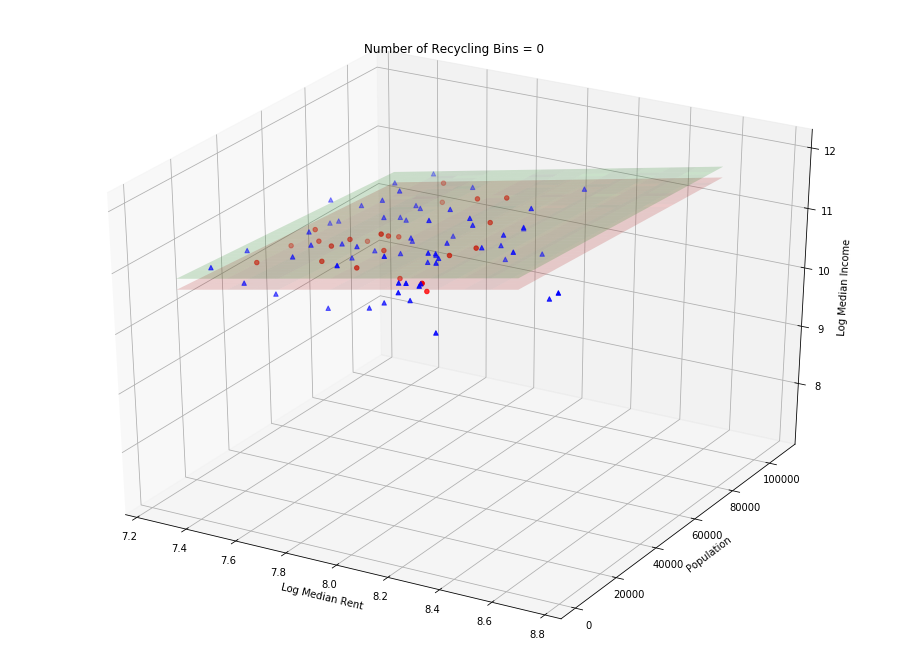

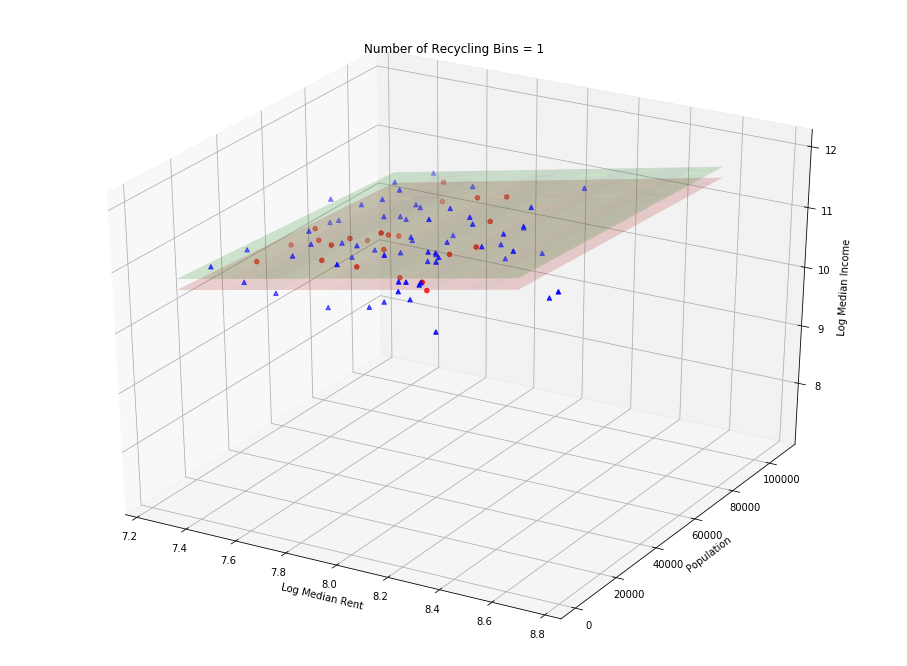

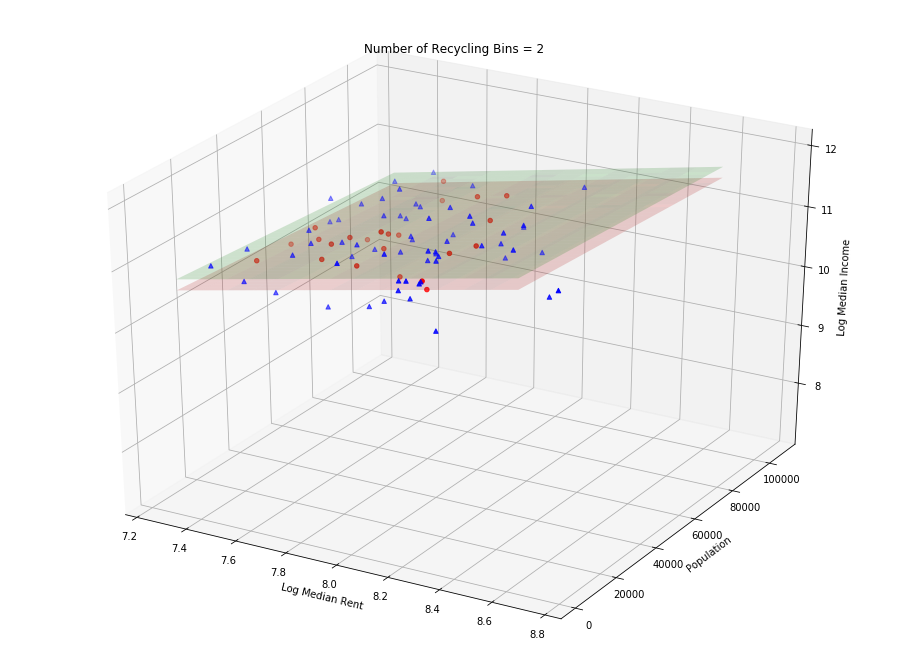

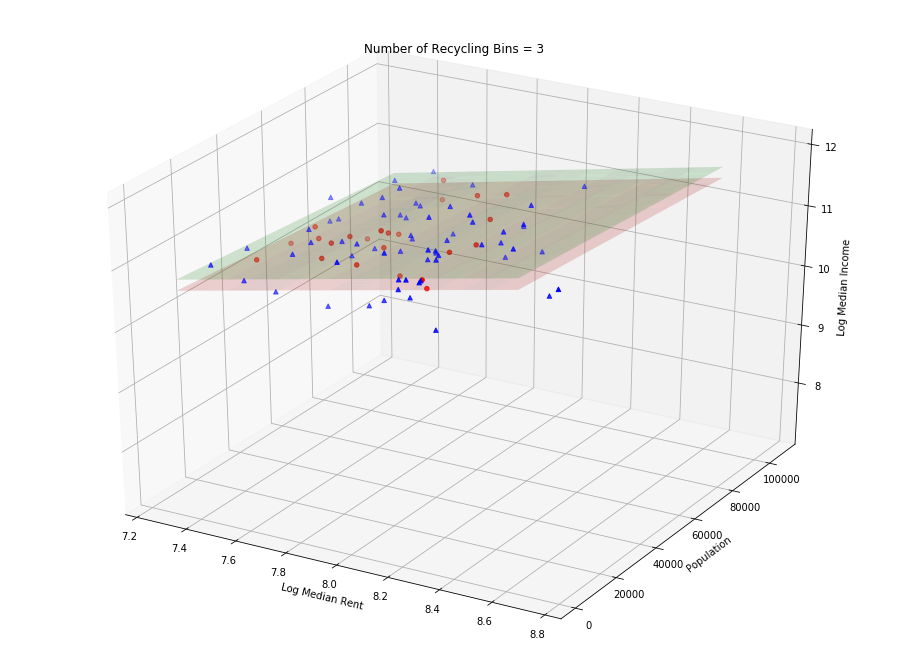

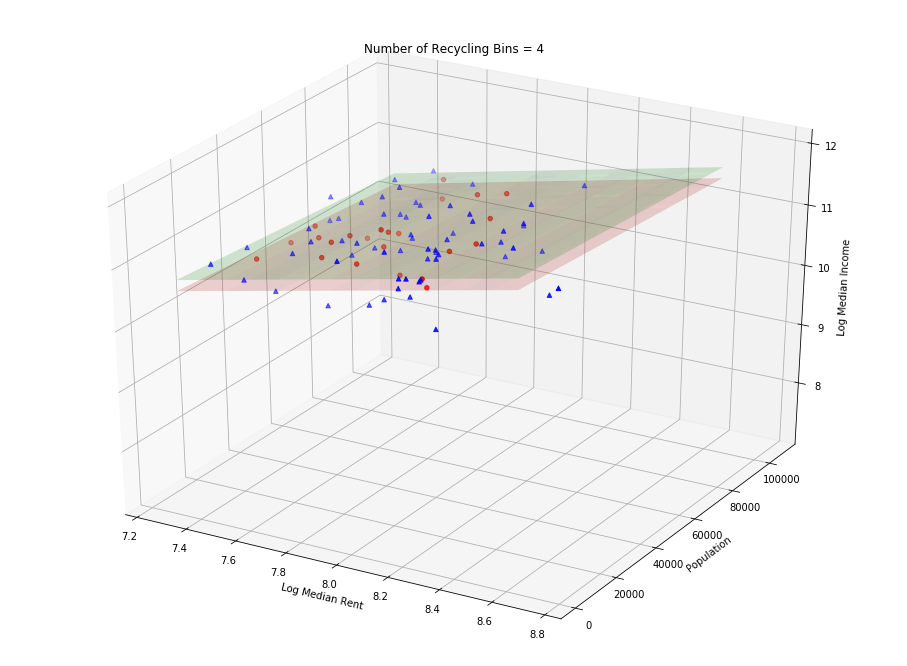

...

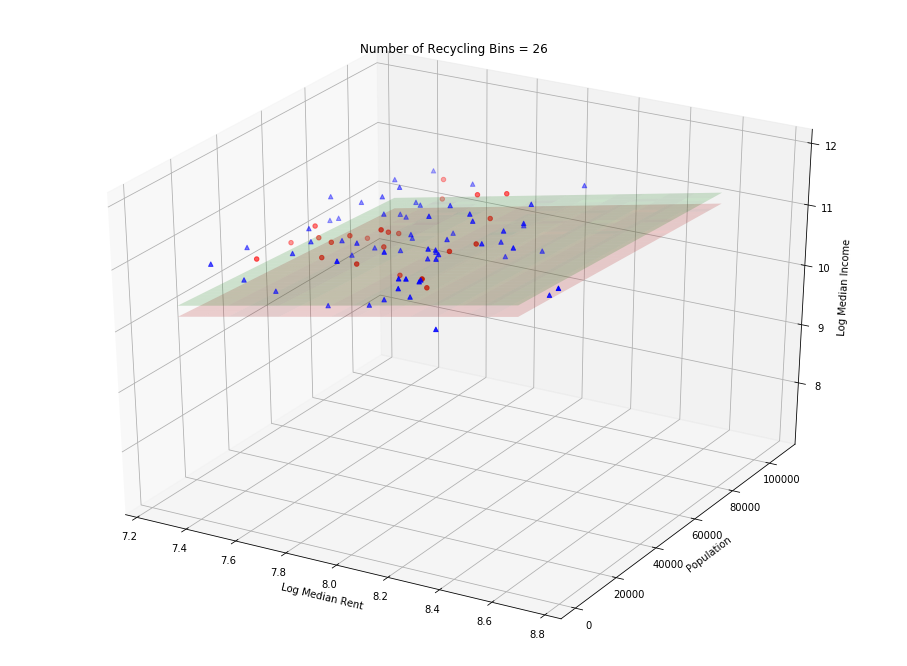

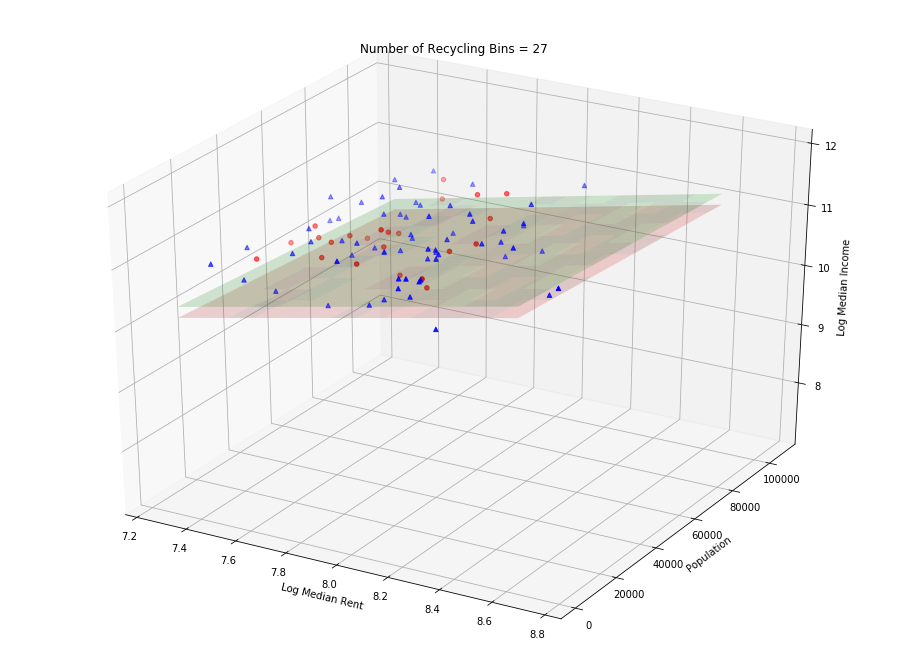

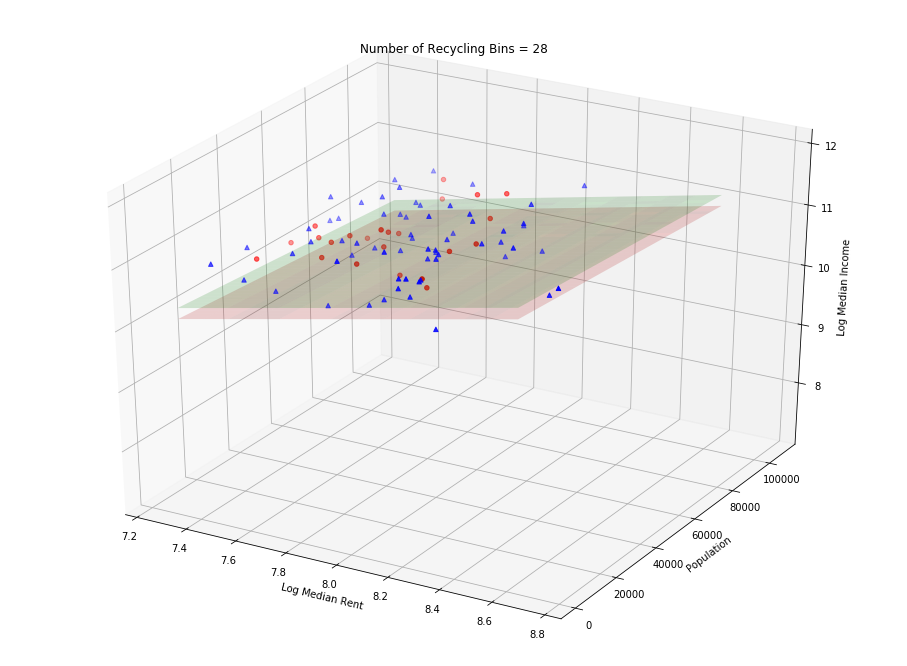

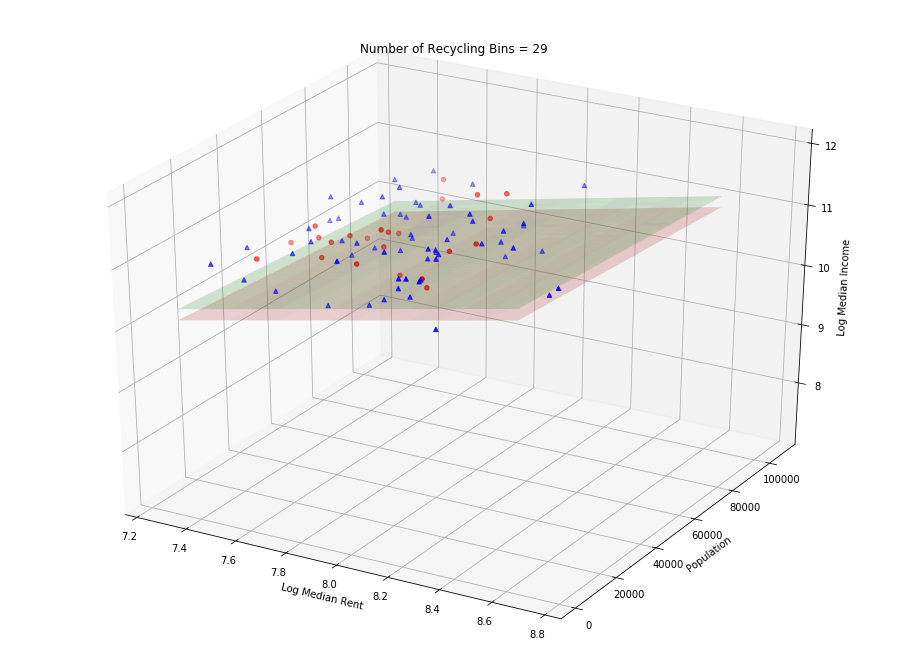

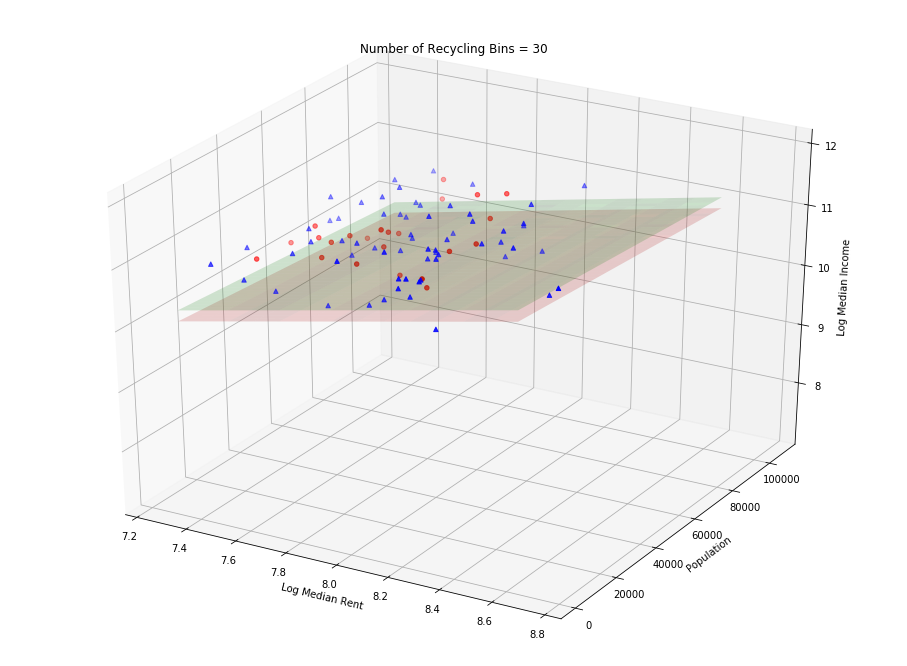

In [9]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(7.3, 8.70, 0.1)
y = np.arange(4500, 105000, 2500)
xx, yy = np.meshgrid(x, y, sparse=True)

recycling_bins = 0
while recycling_bins <=30:

    fig = plt.figure(figsize=[16,12])
    ax = fig.add_subplot(111, projection='3d')
    
    
    for c, m, s in [('r', 'o', 0), ('b', '^', 1)]:
        xs = df[df.subway_dummy == s].logrent
        ys = df[df.subway_dummy == s].population
        zs = df[df.subway_dummy == s].logincome
        ax.scatter(xs, ys, zs, c=c, marker=m)
        ax.plot_surface(np.array([xs]), np.array([ys]), np.array([xs]), alpha=0.2)
    
    #ax = fig.add_subplot(111,projection='3d')
    zz0=4.3235+xx*0.8895-yy*2.874*10**(-6)-recycling_bins*0.0189
    zz1=4.3235+xx*0.8895-0.1790-yy*2.874*10**(-6)-recycling_bins*0.0189
    # plot the surface
    ax.plot_surface(xx, yy, zz0, alpha=0.2)
    ax.plot_surface(xx, yy, zz1, alpha=0.2)
    
    ax.set_xlabel('Log Median Rent')
    ax.set_ylabel('Population')
    ax.set_zlabel('Log Median Income')
    
    plt.title(f'Number of Recycling Bins = {recycling_bins}')
    plt.show()
    recycling_bins += 1

In [ ]:
def plot_looper(snapshot_number, z_level):
    #this will only work correctly with n = 10
    t = 0
    file_title = 'z'
    while t < tf / dt:
        fig = plt.figure()
        ax = fig.add_subplot(111, projection = '3d')
        X = [[0,1,2,3,4,5,6,7,8,9],[9,0,1,2,3,4,5,6,7,8],[8,9,0,1,2,3,4,5,6,7],[7,8,9,0,1,2,3,4,5,6],[6,7,8,9,0,1,2,3,4,5],[5,6,7,8,9,0,1,2,3,4],[4,5,6,7,8,9,0,1,2,3],[3,4,5,6,7,8,9,0,1,2],[2,3,4,5,6,7,8,9,0,1],[1,2,3,4,5,6,7,8,9,0]]
        Y = [[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9],[0,1,2,3,4,5,6,7,8,9]]
        Z = conc[X,Y,z_level, t]
        
        file_title += 'z'
        ax.scatter(X, Y, Z, c = 'r', marker = 'o')
        fig.savefig(f'model_image{file_title}'.format('/Users/justinmitchell/Desktop/python_files/dsc-1-01-05-setting-up-environment/Model_Images/z'))
        
import os
import imageio
png_dir = '/Users/justinmitchell/Desktop/python_files/dsc-1-01-05-setting-up-environment/Model_Images'
images = []
for file_name in os.listdir(png_dir):
    if file_name.endswith('.png'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
imageio.mimsave('/Users/justinmitchell/Desktop/python_files/dsc-1-01-05-setting-up-environment/Model_Images/model.gif', images)

/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


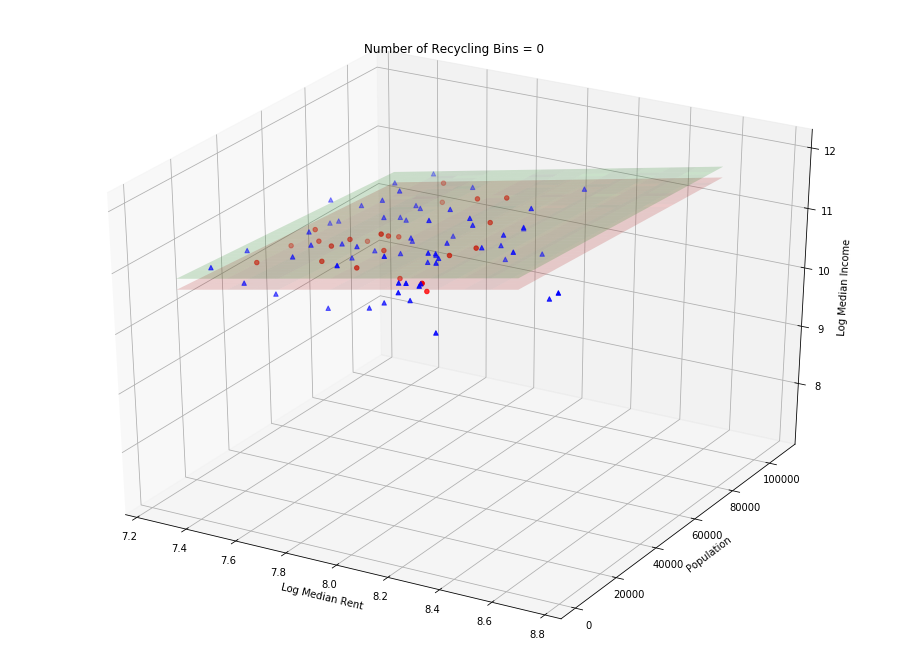

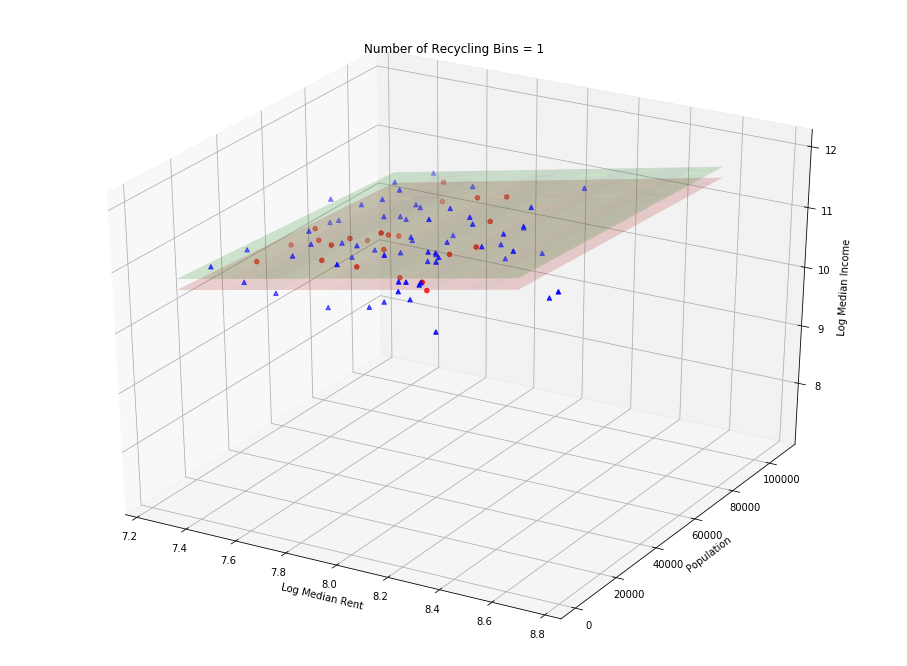

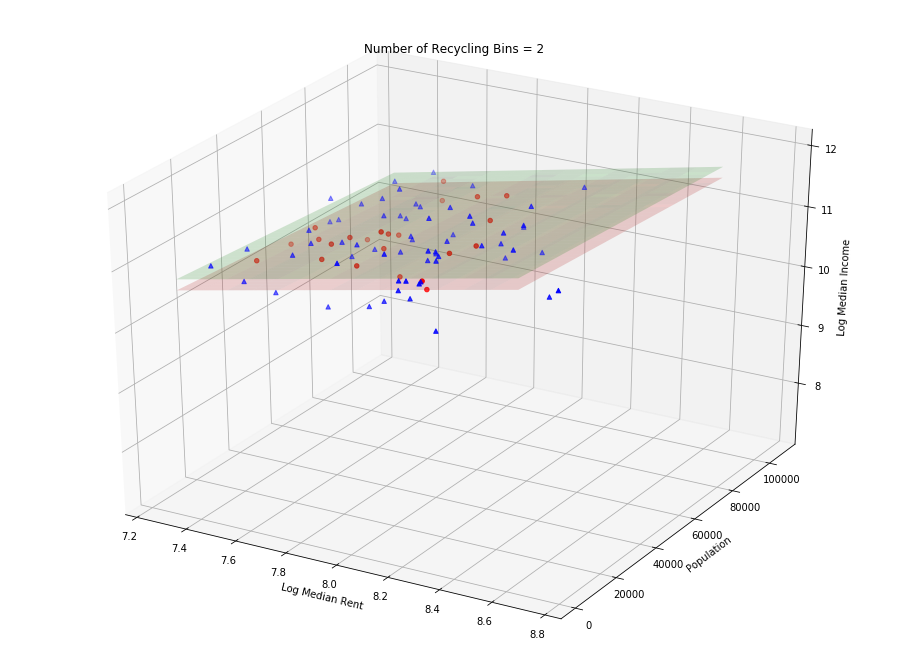

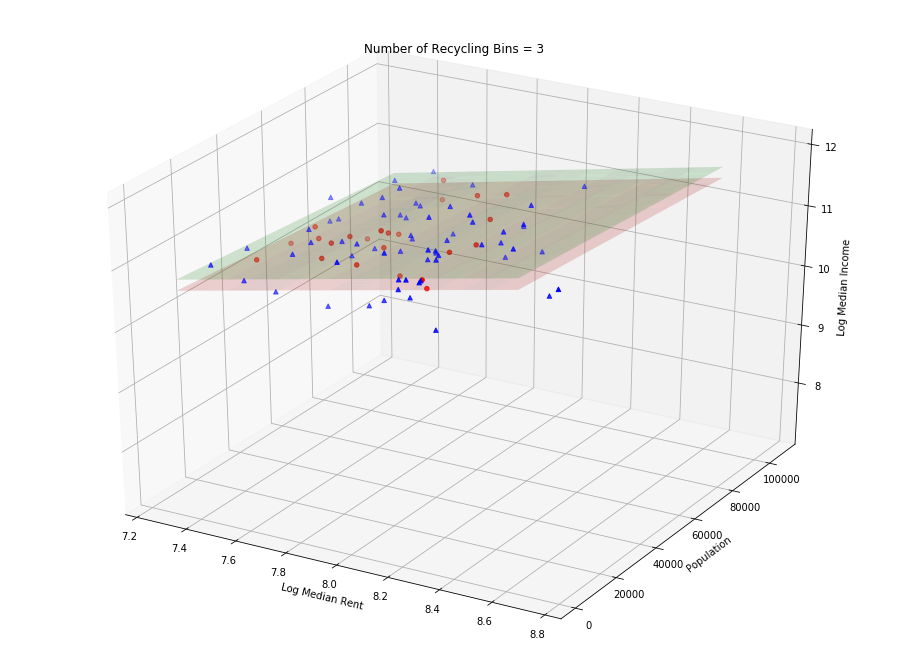

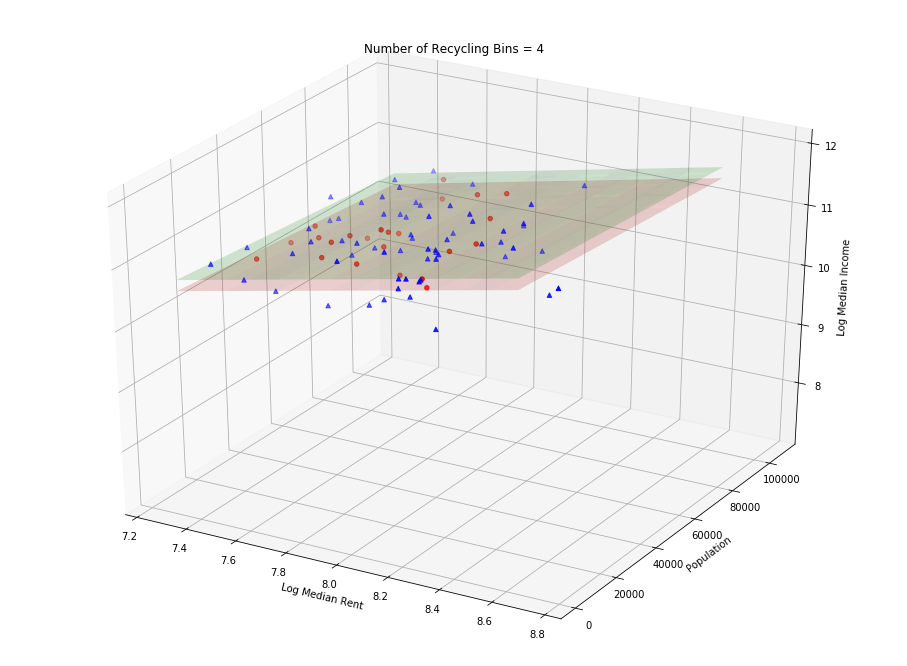

...

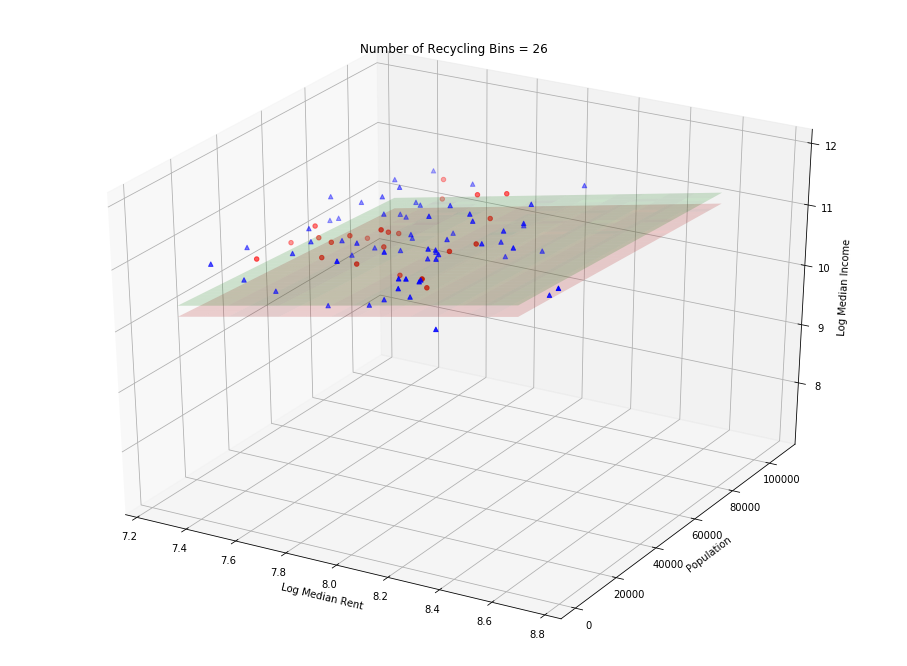

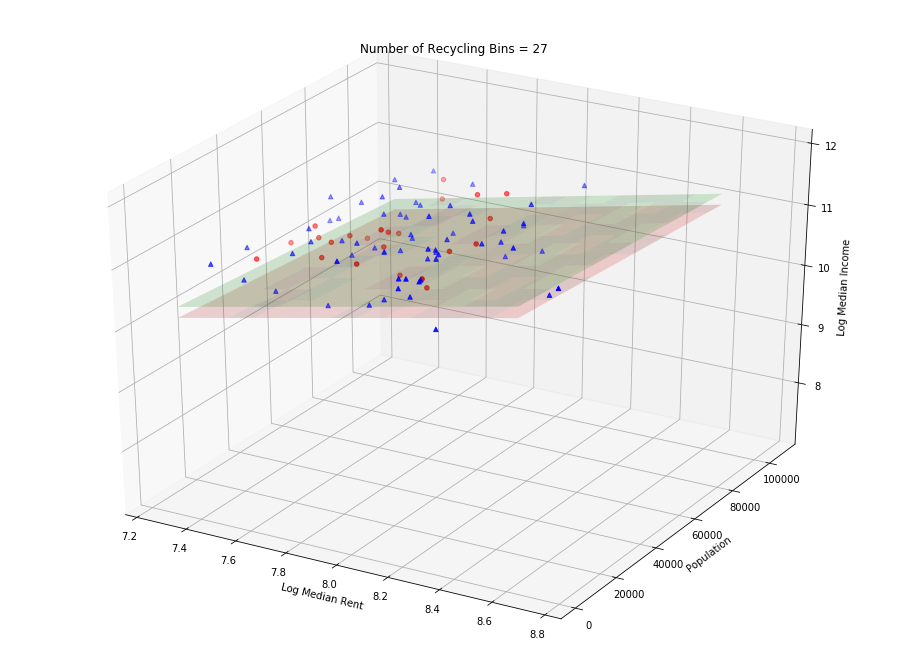

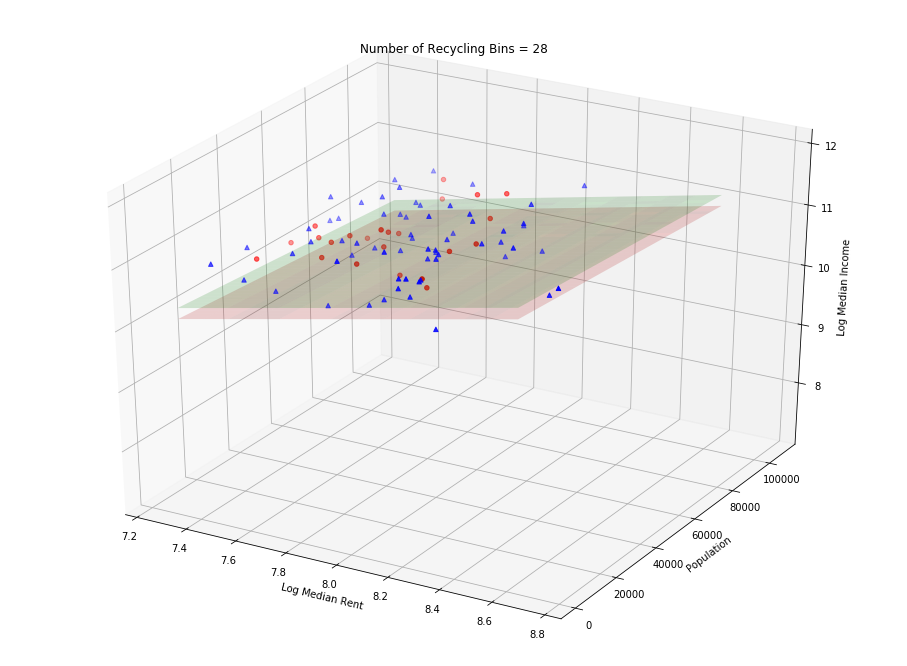

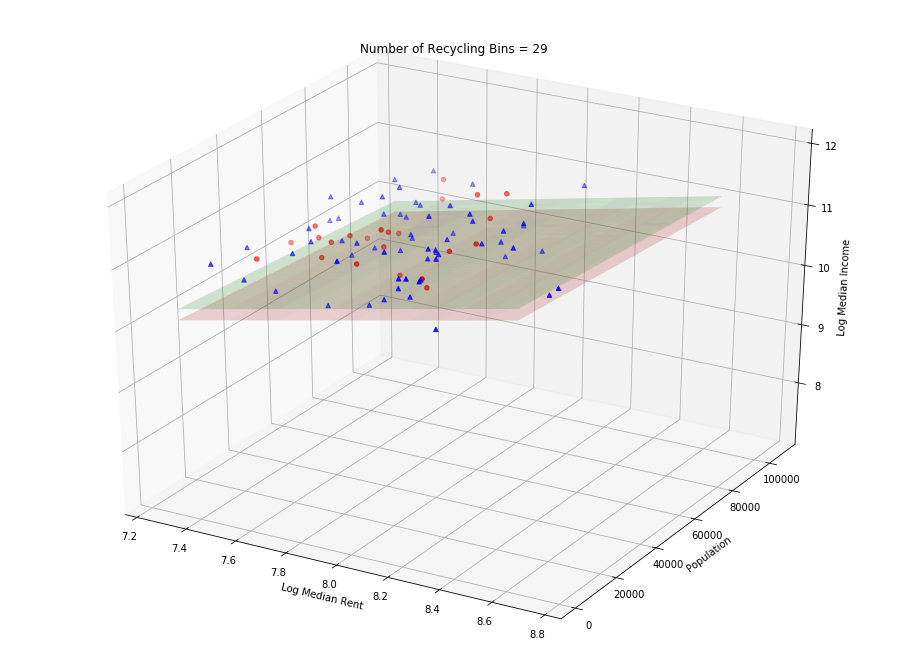

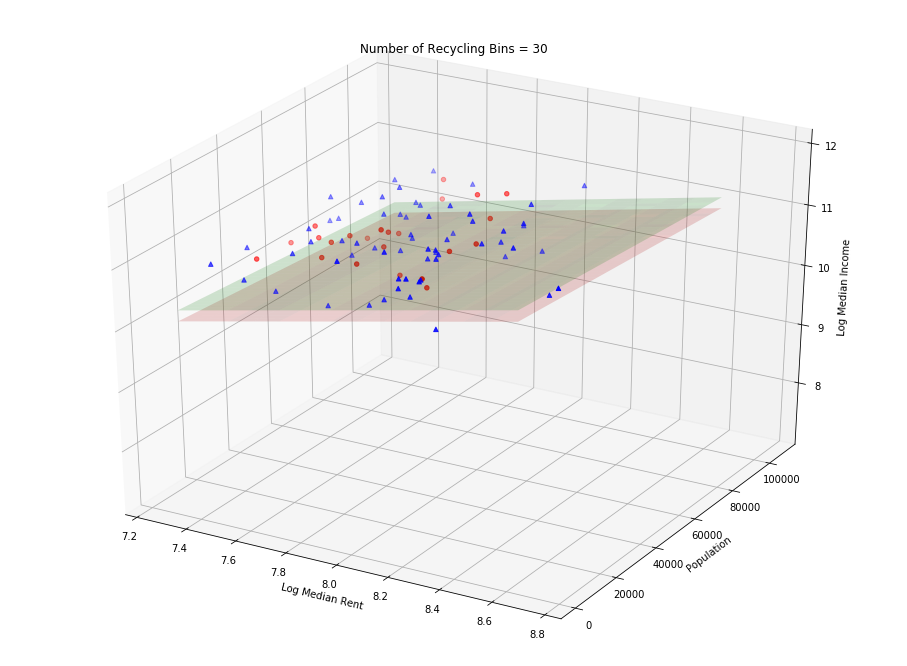

In [10]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

x = np.arange(7.3, 8.70, 0.1)
y = np.arange(4500, 105000, 2500)
xx, yy = np.meshgrid(x, y, sparse=True)

recycling_bins = 0
file_title = 'z'
while recycling_bins <=30:
    fig = plt.figure(figsize=[16,12])
    ax = fig.add_subplot(111, projection='3d')
    
    
    for c, m, s in [('r', 'o', 0), ('b', '^', 1)]:
        xs = df[df.subway_dummy == s].logrent
        ys = df[df.subway_dummy == s].population
        zs = df[df.subway_dummy == s].logincome
        ax.scatter(xs, ys, zs, c=c, marker=m)
        ax.plot_surface(np.array([xs]), np.array([ys]), np.array([xs]), alpha=0.2)
    
    #ax = fig.add_subplot(111,projection='3d')
    zz0=4.3235+xx*0.8895-yy*2.874*10**(-6)-recycling_bins*0.0189
    zz1=4.3235+xx*0.8895-0.1790-yy*2.874*10**(-6)-recycling_bins*0.0189
    # plot the surface
    ax.plot_surface(xx, yy, zz0, alpha=0.2)
    ax.plot_surface(xx, yy, zz1, alpha=0.2)
    
    ax.set_xlabel('Log Median Rent')
    ax.set_ylabel('Population')
    ax.set_zlabel('Log Median Income')
    
    file_title += 'z'
    plt.title(f'Number of Recycling Bins = {recycling_bins}')
    fig.savefig(f'/Users/justinmitchell/Desktop/python_files/Flatiron/Projects/Project_2/4d_regression_gif/{file_title}')
    recycling_bins += 1

In [11]:
import os
import imageio
png_dir = '/Users/justinmitchell/Desktop/python_files/Flatiron/Projects/Project_2/4d_regression_gif'
images = []
for file_name in os.listdir(png_dir):
    if file_name.endswith('.png'):
        file_path = os.path.join(png_dir, file_name)
        images.append(imageio.imread(file_path))
imageio.mimsave('/Users/justinmitchell/Desktop/python_files/Flatiron/Projects/Project_2/4d_regression_gif.gif', images)